In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from saxs_data_processing import io, manipulate, target_comparison, subtract, sasview_fitting
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import pandas as pd
import json
import sys
sys.path.append('../../visualizations/phase_diagram_viz')
import utils as pd_utils

## User parameter setup

List of all background files to use. Data loading function will find associated data files in the same directory as backgrounds.

In [3]:
background_fps = ['/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2025_01_23_Round2_Random/03919_F9-T2_Ethanol1_000.dat',
                  '/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2025_01_29_80nmOpt_Round1/background_1/03962_C2-T2_Ethanol_1_000.dat',
                  '/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2025_01_29_80nmOpt_Round1/background_2/03984_C3-T2_Ethanol_2_000.dat',
                  '/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2205_01_31_80nm_Round2/04005_F11-T2_Ethanol_1_000.dat',
                  '/mnt/c/Users/bgpel/My Drive/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2025_02_04_80nmBatch3/04041_B11-T2_Ethanol_1_000.dat'
                  ]

Select q ranges. Right now this relies on manual q range selection to a certain extent. We subtract background and fit the spline on a larger q-range, then evaluate the spline on a subset of the larger q range to avoid spline edge effects.

In [4]:
# q range to consider up to and including spline fit step
q_min_subtract = 0.002
q_max_subtract = 0.035

# q range to interpolate spline fit on and perform distance metric calculation with
q_min_spl = 0.003
q_max_spl = 0.03
n_interpolate_gridpts = 1001 # number of grid points to interpolate q on.

Select target particle parameters. Target is spherical particles with radius r and polydispersity pdi

In [5]:
target_r_nm = 40
target_r_angs = target_r_nm*10
target_pdi = 0.08
sld_silica = 8.575
sld_etoh = 9.611

Set processing and optimization parameters for distance calculation

In [6]:
# SavGol denoise filter parameters
savgol_n = 15
savgol_order = 3
# minimum data length - data with less than ~100 data points is due to valid data selection step in subtraction and is likley too noisy to do anything with.
min_data_len = 100

# spline fit parameters
s = 0.05
k = 3

#scale parameters
n_avg = 100

# Amplitude-phase distance parameters
optim = "DP"
grid_dim = 10

amplitude_weight = 0.1

## ######################## STOP: Don't touch anything below here \#############################


## Load data

In [7]:
sample_data, uuid2bkg, data_fps = io.load_biocube_data_with_background(background_fps, 24)

/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/io.py:150: UserWarning: Duplicate UUID found for 7c4d74ad-5362-4981-b7a5-52fee1cd2e48. Check your file naming
  warnings.warn(
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/io.py:150: UserWarning: Duplicate UUID found for ec102405-f168-46a3-935d-2d24fdaa5b1f. Check your file naming
  warnings.warn(


In [8]:
len(data_fps)

92

In [9]:
sample_data['9b4974c6-3261-4669-87d4-17f776c3fbc9']

(            q             I          sig
 0    0.000076  8.752746e+06  1936.507266
 1    0.000229  8.119836e+06  1318.880978
 2    0.000382  6.759734e+06   761.073839
 3    0.000535  5.287187e+06   673.091832
 4    0.000688  4.001849e+06   494.912344
 ..        ...           ...          ...
 900  0.137607  0.000000e+00     0.199330
 901  0.137760  0.000000e+00     0.155035
 902  0.137913  0.000000e+00     0.232554
 903  0.138066  0.000000e+00     0.465109
 904  0.138219  0.000000e+00     0.465111
 
 [905 rows x 3 columns],
 {'EDF_DataBlockID': '0.Image.Psd',
  'EDF_BinarySize': 4366944,
  'EDF_HeaderSize': 3584,
  'ByteOrder': 'LowByteFirst',
  'DataType': 'FloatValue',
  'Dim_1': 1028,
  'Dim_2': 1062,
  'Image': 0,
  'HeaderID': 'EH:000000:000000:000000',
  'Size': 4366944,
  'BIO_BUFFER': None,
  'BIO_CELL_TEMP': 25.01,
  'BIO_CODE': 'None',
  'BIO_CONC': 1.0,
  'BIO_DESCRIPTION': '9b4974c6-3261-4669-87d4-17f776c3fbc9',
  'BIO_PROJECT': 'None',
  'BIO_RUN_NUMBER': 4051,
  'BIO_SAM

0: c563cb4d-d727-437f-9a6a-fef3eccbbe50
1: 3ef8b92f-f2eb-4134-ad6c-ae3329408457
2: 0507cf19-673b-4d6b-922e-c21f718ad4fe
3: 82fc5e1c-5d6e-4ecd-82c3-eb912535a0d7
4: 9964ab9f-5b01-4ae2-b492-a1be55ce083f
5: d263a9a8-70c2-49a4-badb-03a72fa16632
6: 586ae478-4dab-4d7d-9382-ab359a49387a
7: 7386215f-7150-48a6-b35f-96cbe5b743cf
8: d408858a-bbae-4227-8e64-6c368a1f3398
9: 0c042bd5-e5ed-4460-9bb9-d8556dba293c
10: 8fbd8649-0d61-4edc-9fe3-1ca354becc5a
11: d4ebf798-d856-406f-9732-f11da412170b
12: e44ddf37-b7d0-420b-bf6c-02535ca6803a
13: 238ebc43-fbc1-4049-b506-1dc041dedb42
14: 8aacf82b-9869-48dd-ad8a-85eaca6ce824
15: a635324c-8eea-4566-af05-e39d8101ef91
16: 08f1d123-975c-4dca-b962-6134f27e4ddc
17: d91aa15e-1296-4485-94d0-0cf924b116de
18: 1537344f-106d-4cb9-b1de-3262334f8665
19: 7c2bc3ea-ff76-42ba-88f9-86fb14a0f437
20: 1ec7142f-1f4f-44ee-965b-da3a052e0b2a
21: 13735048-3ac7-447e-8bca-7af4fda689cb
22: f041b533-6c1d-4be3-aa7b-01521b804bf8
23: 1c5c16fb-5f52-451d-a370-36a6418ab246
24: 0a4b4bec-376d-4106-853

/tmp/ipykernel_552/581014801.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


26: da675871-7139-4a31-8e76-317fb87385fa
27: 9f769eed-2173-4aa3-b71b-60f6488e526f
28: c62bf89a-0e46-4e1c-9e83-89c38787a58e
29: 77c8bfe5-d105-433e-8fcc-12675094a30e
30: fa064c37-87e6-4f7f-9189-02b4ddf6dd6e
31: 4808d774-6c9b-4436-86ed-5355d9731910
32: 7c4d74ad-5362-4981-b7a5-52fee1cd2e48
33: 2b778460-0ea0-4134-8256-cc0950b1838f
34: e73de4ac-ae2f-40ac-adc9-6f4acfbb4678
35: 6e8ce412-9cdc-41b3-b8ae-fa08acb207cf
36: ec102405-f168-46a3-935d-2d24fdaa5b1f
37: 7bf7296f-8eae-4228-a615-3d7b8c142d89
38: 7d38b9e2-e3d3-494a-b43a-2997b6d7bf4c
39: 2252e0ad-3f6b-4234-9603-2420244f1080
40: bf8528f0-4b3a-429d-bb11-da3c7d2c66f7
41: 4c109404-def8-474c-a617-783ec03ec895
42: 9cff952d-2d28-47b2-bb0b-d49602fd36d2
43: 60e54cc2-4d8e-4d0e-aab8-390bef44dcf8
44: bde1a208-9fee-499e-843b-7866aa600a77
45: 8f8ed9a5-2ea3-440f-93bf-01d9f6cbc33d
46: f93ed4f1-94fb-4806-835e-4975da39c452
47: 99049d8c-98af-4240-ad63-7784477d7c02
48: a35e929b-49fd-4bed-a211-70524348fe8e
49: 069a5c5d-4bfd-419e-a96e-36215855466d
50: 627048de-ccf

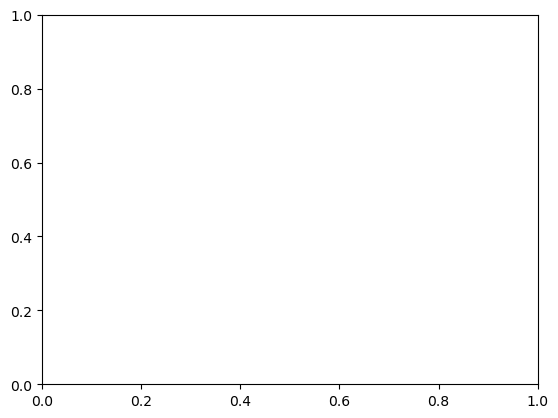

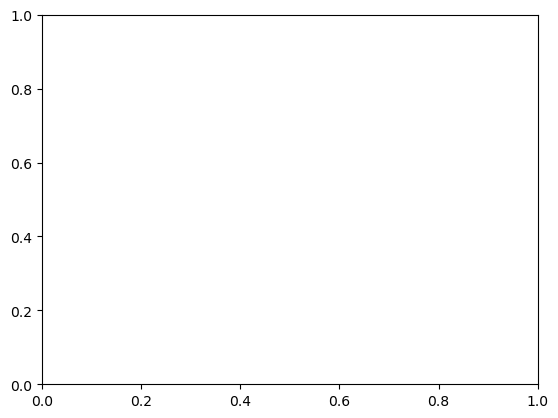

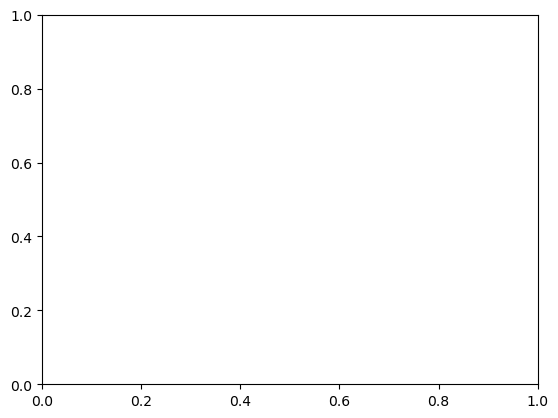

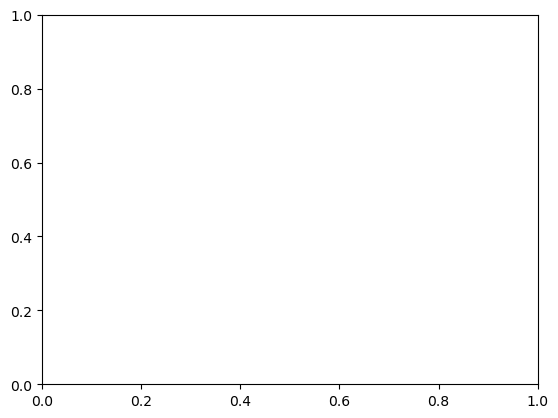

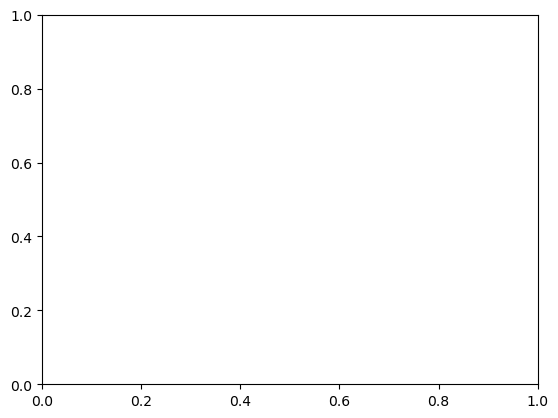

...

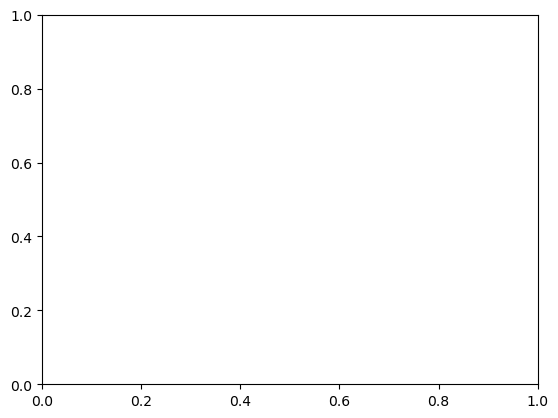

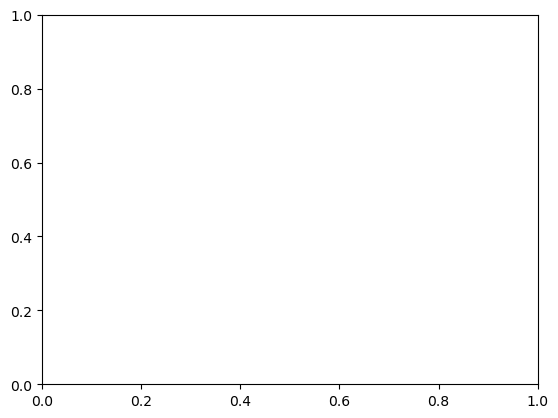

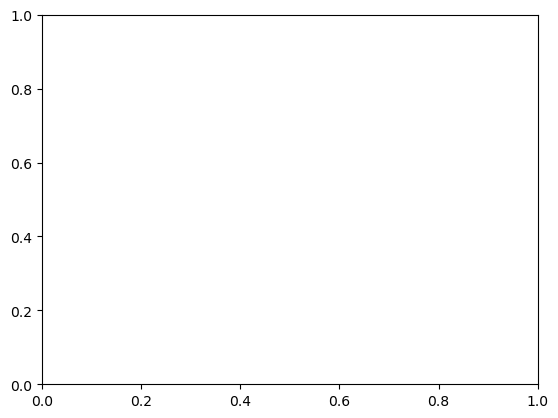

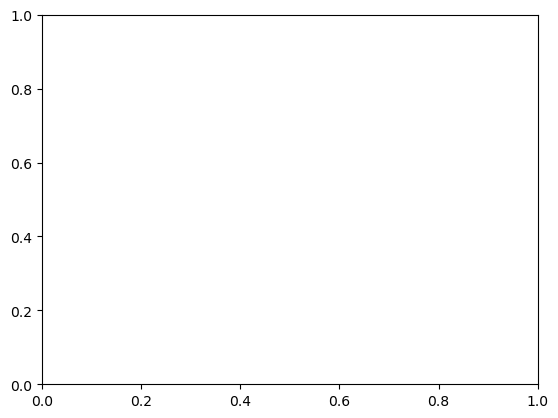

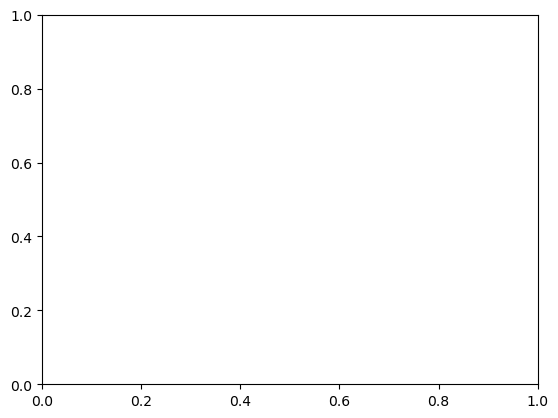

In [11]:
# subtract things for Kiran
processing_dataset = {}
counter = 0
for uuid_val, data_val in sample_data.items():
    print(f'{counter}: {uuid_val}')
    counter += 1
    meas_entry = {}
    meas_entry['original_data'] = data_val[0]
    background = uuid2bkg[uuid_val]
    meas_entry['background'] = background[0]
    # 1. Subtract background and select q range
    subtracted = subtract.chop_subtract(data_val[0], background[0], hiq_thresh=1)

    if subtracted is not None:
        #fig, ax = plt.subplots()
        #plt.loglog(subtracted['q'], subtracted['I'])
        io.write_dat(subtracted, data_val[1], f'../../subtracted_data_kiran/{uuid_val}.dat')

## Calculate target scattering

In [41]:
q_grid = np.linspace(np.log10(q_min_spl), np.log10(q_max_spl), n_interpolate_gridpts)

q_grid_nonlog = 10**q_grid
target_I = target_comparison.target_intensities(q_grid_nonlog, target_r_angs, target_pdi, sld_silica, sld_etoh)
target_I = np.log10(target_I)

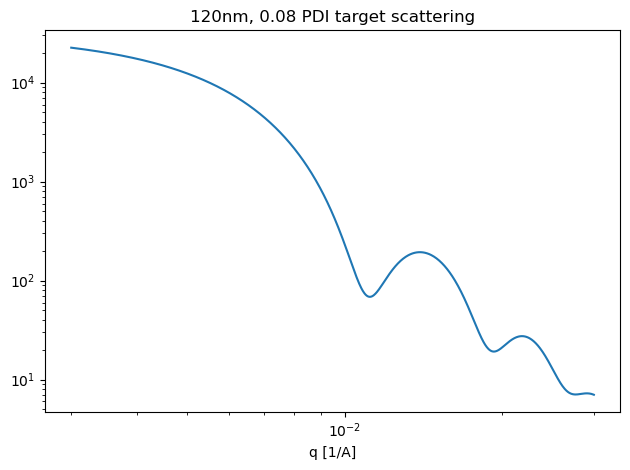

In [42]:
fig, ax = plt.subplots()
ax.loglog(10**q_grid, 10**target_I)
ax.set_xlabel('q [1/A]')
ax.set_title('120nm, 0.08 PDI target scattering')
plt.tight_layout()
plt.savefig('target_profile_120nm.png', dpi = 300)

## Run full processing pipeline

In [43]:
processing_dataset = {}
counter = 0
for uuid_val, data_val in sample_data.items():
    print(f'{counter}: {uuid_val}')
    counter += 1
    meas_entry = {}
    meas_entry['original_data'] = data_val[0]
    background = uuid2bkg[uuid_val]
    meas_entry['background'] = background[0]
    # 1. Subtract background and select q range
    subtracted = subtract.chop_subtract(data_val[0], background[0], hiq_thresh=1)
    
    if subtracted is None:
        # if subtract returned None, data has issues and we are done with this sample
        meas_entry['status'] = 'failed'
        meas_entry['failure_point'] = 'background_subtraction'
        processing_dataset[uuid_val] = meas_entry
        print(f'Sample {uuid_val} failed at background subtraction')
        continue
        
    else:
        # q range selection
        subtracted = subtracted[subtracted['q'] < q_max_subtract]
        subtracted = subtracted[~subtracted['I'].isna()]
        subtracted = subtracted[subtracted['I'] > 0] # drop negative values 
        # screen on dataset length
        if len(subtracted) < min_data_len:
            meas_entry['status'] = 'failed'
            meas_entry['failure_point'] = 'subtracted_data_length'
            processing_dataset[uuid_val] = meas_entry
            print(f'Sample {uuid_val} failed due to data length')
            continue
        else:
            meas_entry['subtracted_clipped'] = subtracted
            meas_entry['status'] = 'valid'
            processing_dataset[uuid_val] = meas_entry


    # 2. Convert everything into log10 space
    q_log = np.log10(subtracted['q'].to_numpy())
    I_log = np.log10(subtracted['I'].to_numpy())

    meas_entry['q_log'] = q_log
    meas_entry['I_log'] = I_log
    
    # 3. denoise filter on intensity
    
    I_savgol = manipulate.denoise_intensity(I_log, savgol_n = savgol_n, savgol_order = savgol_order)

    meas_entry['I_savgol'] = I_savgol

    # 4. Spline fit and interpolate
    I_spline = manipulate.fit_interpolate_spline(q_log, I_savgol, q_grid, s = s, k = k)
    
    meas_entry['I_spline'] = I_spline

    # 5. scale onto target
    I_scaled = manipulate.scale_intensity_highqavg(I_spline, target_I, n_avg = n_avg)

    meas_entry['I_scaled'] = I_scaled

    #6. Calculate AP distance

    amplitude, phase = target_comparison.ap_distance(q_grid, I_scaled, target_I, optim = optim, grid_dim = grid_dim)

    ap_sum = amplitude_weight * amplitude + (1-amplitude_weight) * phase

    meas_entry['amplitude_distance'] = amplitude
    meas_entry['phase_distance'] = phase
    meas_entry['ap_sum_distance'] = ap_sum


    ## calculate raw RMSE
    meas_df = pd.DataFrame({'q':10**q_grid, 'I':10**I_scaled, 'sig':np.zeros(len(I_scaled))})
    #target_df = pd.DataFrame({'q':10**q_grid, 'I':10**target_I, 'sig':np.zeros(len(target_I))})
    
    raw_rmse = target_comparison.rmse_distance(I_scaled, target_I, log = False) # these intensities are already in log
    screened_rmse = target_comparison.calculate_distance_powerlawscreen(subtracted, meas_df, 10**target_I)

    meas_entry['rmse_raw'] = raw_rmse
    processing_dataset[uuid_val] = meas_entry
    

0: c563cb4d-d727-437f-9a6a-fef3eccbbe50


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


1: 3ef8b92f-f2eb-4134-ad6c-ae3329408457


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


2: 0507cf19-673b-4d6b-922e-c21f718ad4fe


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


3: 82fc5e1c-5d6e-4ecd-82c3-eb912535a0d7


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


4: 9964ab9f-5b01-4ae2-b492-a1be55ce083f


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


5: d263a9a8-70c2-49a4-badb-03a72fa16632


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


6: 586ae478-4dab-4d7d-9382-ab359a49387a
Sample 586ae478-4dab-4d7d-9382-ab359a49387a failed due to data length
7: 7386215f-7150-48a6-b35f-96cbe5b743cf


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


8: d408858a-bbae-4227-8e64-6c368a1f3398


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


9: 0c042bd5-e5ed-4460-9bb9-d8556dba293c


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


10: 8fbd8649-0d61-4edc-9fe3-1ca354becc5a


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


11: d4ebf798-d856-406f-9732-f11da412170b


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


12: e44ddf37-b7d0-420b-bf6c-02535ca6803a


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


13: 238ebc43-fbc1-4049-b506-1dc041dedb42


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


14: 8aacf82b-9869-48dd-ad8a-85eaca6ce824


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


15: a635324c-8eea-4566-af05-e39d8101ef91


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


16: 08f1d123-975c-4dca-b962-6134f27e4ddc


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


17: d91aa15e-1296-4485-94d0-0cf924b116de


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


18: 1537344f-106d-4cb9-b1de-3262334f8665


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


19: 7c2bc3ea-ff76-42ba-88f9-86fb14a0f437


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


20: 1ec7142f-1f4f-44ee-965b-da3a052e0b2a


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


21: 13735048-3ac7-447e-8bca-7af4fda689cb


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


22: f041b533-6c1d-4be3-aa7b-01521b804bf8


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


23: 1c5c16fb-5f52-451d-a370-36a6418ab246


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


24: 0a4b4bec-376d-4106-853e-53c50b36e515
25: ee885bbe-4e05-426d-9772-0e1e3293e727


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


26: da675871-7139-4a31-8e76-317fb87385fa


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


27: 9f769eed-2173-4aa3-b71b-60f6488e526f
1.254131284844074
1.1403261915510066
78


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


28: c62bf89a-0e46-4e1c-9e83-89c38787a58e


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


29: 77c8bfe5-d105-433e-8fcc-12675094a30e


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


30: fa064c37-87e6-4f7f-9189-02b4ddf6dd6e
1.1525612831486625
0.542660143398656
96


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


31: 4808d774-6c9b-4436-86ed-5355d9731910


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


32: 7c4d74ad-5362-4981-b7a5-52fee1cd2e48
33: 2b778460-0ea0-4134-8256-cc0950b1838f


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


34: e73de4ac-ae2f-40ac-adc9-6f4acfbb4678


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


35: 6e8ce412-9cdc-41b3-b8ae-fa08acb207cf


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


36: ec102405-f168-46a3-935d-2d24fdaa5b1f


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


37: 7bf7296f-8eae-4228-a615-3d7b8c142d89
-0.12156409744221734
-0.19919903929440938
466


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


38: 7d38b9e2-e3d3-494a-b43a-2997b6d7bf4c


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


39: 2252e0ad-3f6b-4234-9603-2420244f1080


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


40: bf8528f0-4b3a-429d-bb11-da3c7d2c66f7


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


41: 4c109404-def8-474c-a617-783ec03ec895


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


42: 9cff952d-2d28-47b2-bb0b-d49602fd36d2


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


43: 60e54cc2-4d8e-4d0e-aab8-390bef44dcf8


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


44: bde1a208-9fee-499e-843b-7866aa600a77


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


45: 8f8ed9a5-2ea3-440f-93bf-01d9f6cbc33d


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


46: f93ed4f1-94fb-4806-835e-4975da39c452


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


47: 99049d8c-98af-4240-ad63-7784477d7c02


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


48: a35e929b-49fd-4bed-a211-70524348fe8e


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


49: 069a5c5d-4bfd-419e-a96e-36215855466d


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


50: 627048de-ccfc-4b9e-998f-c83de2ac353f


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


51: 9f8223fc-c3be-4ca7-b9c9-55fa9c4daa60


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


52: 89da42c0-d6c2-4797-816d-122cf69c896e


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


53: 85960d22-ab40-4cb4-a325-6b021a6be6bb


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


54: de29a3a6-f8a1-4a5c-91ac-5619a023658a


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


55: 51399e9b-be16-4017-b11e-6ed648524864


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


56: fe1c667e-1c75-4505-ae6f-3ac9ff380abd


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


57: b95e9e19-0e75-49cc-a3c0-5a04ecc43d6b


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


58: 2402a10c-a5e0-47a1-80cf-13579864101f


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


59: 02cf2067-1f41-45ff-b934-d79933ce0d9d


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


60: 5a500297-11d3-44b0-b7d9-98b6753df47b


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


61: ae77b287-f241-4b36-8915-b9eaac29d424


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


62: 0bfe570a-c73d-4628-95a0-2a6d5b319df9


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


63: 13baad0b-f873-4239-ba58-eebe0789cecb


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


64: c7368ca4-ab47-4788-9336-d8dc80ee8273


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


65: c51cf7d2-8b37-4a2a-a800-0e628289334c


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


66: b8ffa852-0645-4ddb-b587-7c24d2cc1dbf


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


67: a01ce3b0-5fd4-4078-8821-881fd5338ce8


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


68: 48da5aa2-9f93-4512-843c-098b23a1880b


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


69: 331fe194-adb0-47d4-a81b-e16511d87d9b


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


70: 2cf0de63-e0fd-4c8c-ae3a-073ff1f6e3d2


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


71: 700ad869-4932-42ae-83f4-3b50b7318c9b


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


72: f0760849-19ea-4064-b5ae-e45aa981996e


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


73: f3cbf509-261b-412c-b083-ea00cf8edf39


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


74: 8331bed0-257f-42ce-b6e0-439b92c237c6


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


75: bd07bf5f-b860-4d60-bb06-8bcf078973cd


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


76: d25c4916-b521-497c-b864-cf91a0aea475


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


77: 311ef7f0-67f0-44f1-8b30-14f89070d209


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


78: a5099251-1d47-4f19-829a-651f742dde01


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


79: 9c7c4090-d1a8-42e9-9f48-29ea62098dff


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


80: 9b4974c6-3261-4669-87d4-17f776c3fbc9


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


81: 6294633a-9219-4287-8b6b-86d972f53cc8


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


82: 53e0a69a-3439-46a5-b7c5-1d465bd2a730


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


83: bc33bc62-9792-4894-8fff-da8a5156f537


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


84: efcb2745-ba00-4f60-9076-a138682a6ac8


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


85: b4077fed-d5e9-487d-a822-df6ec0675b8c


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


86: bc3068c4-66c5-4321-8b6a-c1c49c486042


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


87: 6835f124-f5d6-43aa-a279-afcb239638af


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


88: f33b86ef-abb4-4015-a39e-7a1447404af8


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


89: 0c9a7a98-4035-453d-ac5c-c95edc1c0de6


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


90: 76682cac-1ccd-4f9e-ac77-90854e231547


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


91: e6581805-cb63-4d4a-a6b8-1cf24627d842


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn("No hiq lim satisfying threshold found, setting value to q max")


In [53]:
amplitude_weight

0.1

### Sanity check subtraction

c563cb4d-d727-437f-9a6a-fef3eccbbe50
3ef8b92f-f2eb-4134-ad6c-ae3329408457
0507cf19-673b-4d6b-922e-c21f718ad4fe
82fc5e1c-5d6e-4ecd-82c3-eb912535a0d7
9964ab9f-5b01-4ae2-b492-a1be55ce083f
d263a9a8-70c2-49a4-badb-03a72fa16632
586ae478-4dab-4d7d-9382-ab359a49387a
failed at  subtracted_data_length
7386215f-7150-48a6-b35f-96cbe5b743cf
d408858a-bbae-4227-8e64-6c368a1f3398
0c042bd5-e5ed-4460-9bb9-d8556dba293c
8fbd8649-0d61-4edc-9fe3-1ca354becc5a
d4ebf798-d856-406f-9732-f11da412170b
e44ddf37-b7d0-420b-bf6c-02535ca6803a
238ebc43-fbc1-4049-b506-1dc041dedb42
8aacf82b-9869-48dd-ad8a-85eaca6ce824
a635324c-8eea-4566-af05-e39d8101ef91
08f1d123-975c-4dca-b962-6134f27e4ddc
d91aa15e-1296-4485-94d0-0cf924b116de
1537344f-106d-4cb9-b1de-3262334f8665
7c2bc3ea-ff76-42ba-88f9-86fb14a0f437
1ec7142f-1f4f-44ee-965b-da3a052e0b2a
13735048-3ac7-447e-8bca-7af4fda689cb
f041b533-6c1d-4be3-aa7b-01521b804bf8
1c5c16fb-5f52-451d-a370-36a6418ab246
0a4b4bec-376d-4106-853e-53c50b36e515
ee885bbe-4e05-426d-9772-0e1e3293e727
da67

/tmp/ipykernel_17919/1424264336.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


85960d22-ab40-4cb4-a325-6b021a6be6bb
de29a3a6-f8a1-4a5c-91ac-5619a023658a
51399e9b-be16-4017-b11e-6ed648524864
fe1c667e-1c75-4505-ae6f-3ac9ff380abd
b95e9e19-0e75-49cc-a3c0-5a04ecc43d6b
2402a10c-a5e0-47a1-80cf-13579864101f
02cf2067-1f41-45ff-b934-d79933ce0d9d
5a500297-11d3-44b0-b7d9-98b6753df47b
ae77b287-f241-4b36-8915-b9eaac29d424
0bfe570a-c73d-4628-95a0-2a6d5b319df9
13baad0b-f873-4239-ba58-eebe0789cecb
c7368ca4-ab47-4788-9336-d8dc80ee8273
c51cf7d2-8b37-4a2a-a800-0e628289334c
b8ffa852-0645-4ddb-b587-7c24d2cc1dbf
a01ce3b0-5fd4-4078-8821-881fd5338ce8
48da5aa2-9f93-4512-843c-098b23a1880b
331fe194-adb0-47d4-a81b-e16511d87d9b
2cf0de63-e0fd-4c8c-ae3a-073ff1f6e3d2
700ad869-4932-42ae-83f4-3b50b7318c9b
f0760849-19ea-4064-b5ae-e45aa981996e
f3cbf509-261b-412c-b083-ea00cf8edf39
8331bed0-257f-42ce-b6e0-439b92c237c6
bd07bf5f-b860-4d60-bb06-8bcf078973cd
d25c4916-b521-497c-b864-cf91a0aea475
311ef7f0-67f0-44f1-8b30-14f89070d209
a5099251-1d47-4f19-829a-651f742dde01
9c7c4090-d1a8-42e9-9f48-29ea62098dff
9

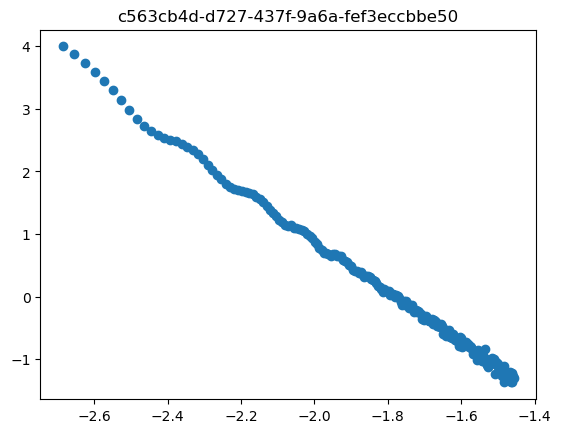

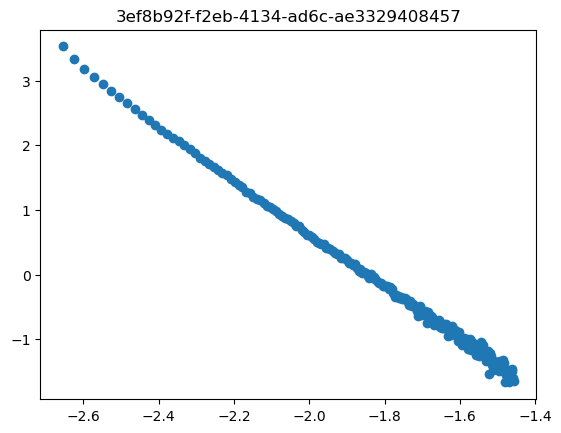

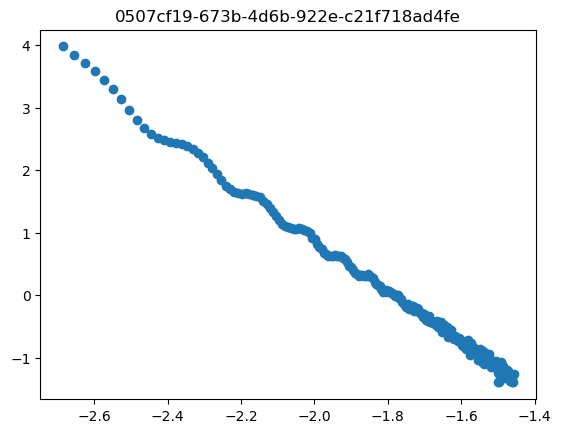

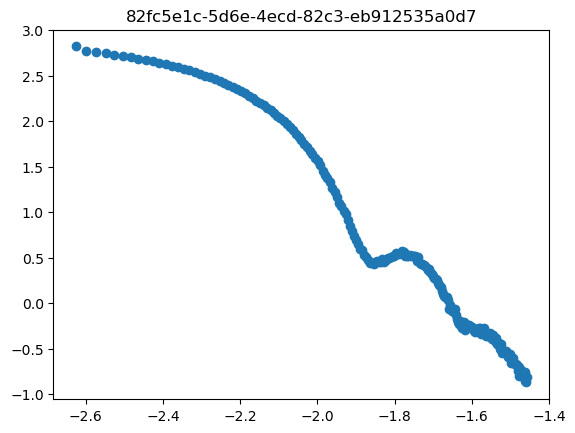

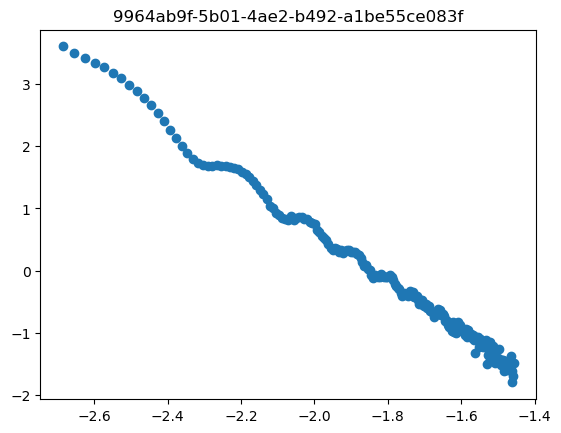

...

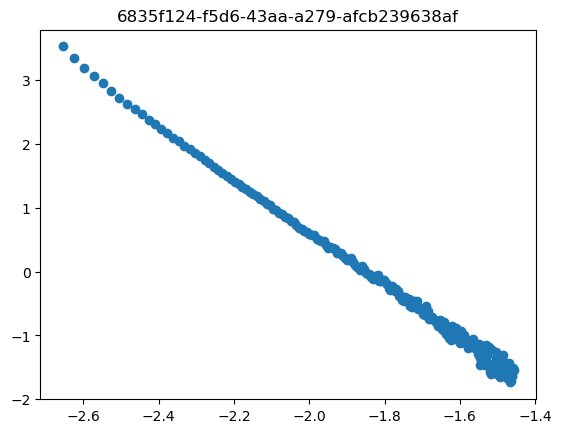

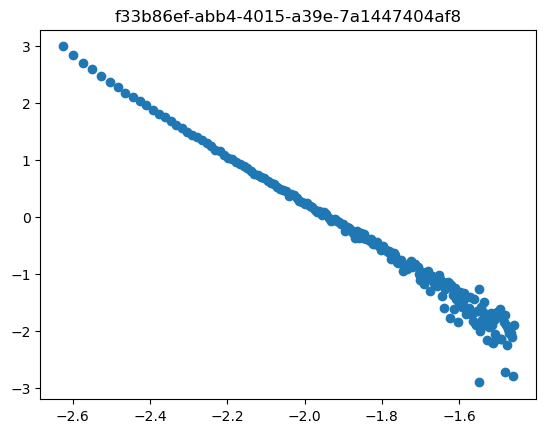

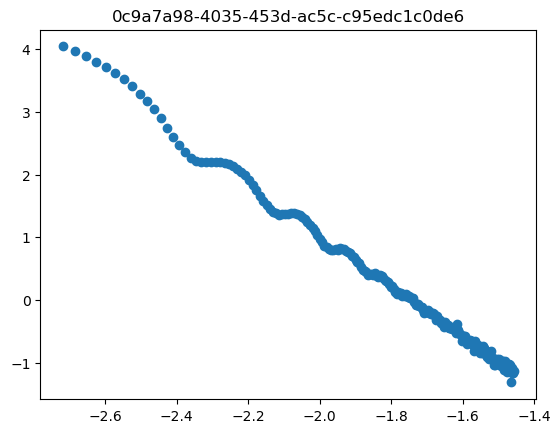

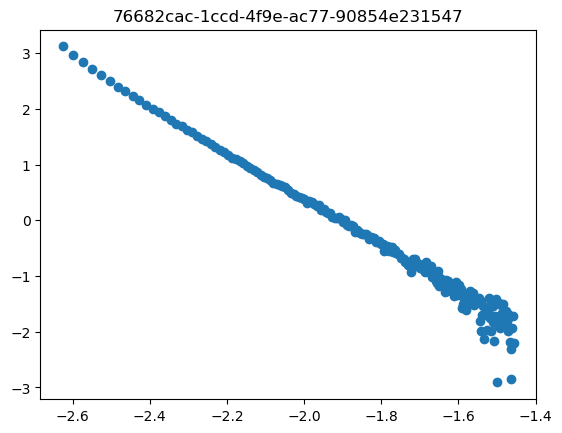

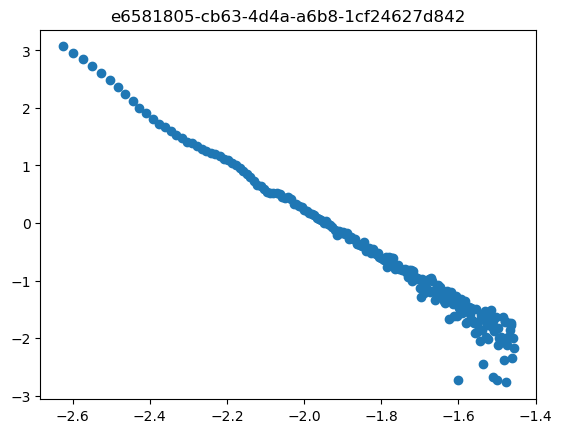

In [44]:
for uuid_val, entry in processing_dataset.items():
    print(uuid_val)
    try:
        status = entry['status']
        if status == 'failed':
            print('failed at ', entry['failure_point'])
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()
    
        I_subtracted = entry['I_log']
        q = entry['q_log']
    
        ax.scatter(q, I_subtracted)
        ax.set_title(uuid_val)

## Sanity check spline fit

/tmp/ipykernel_17919/3859189070.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


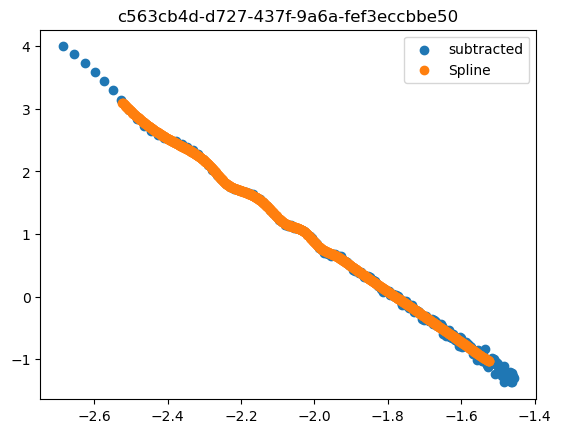

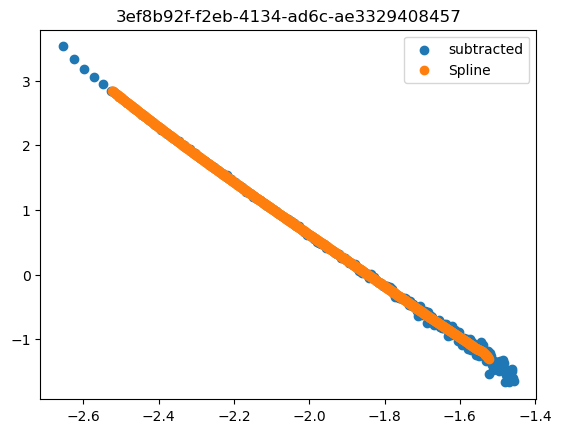

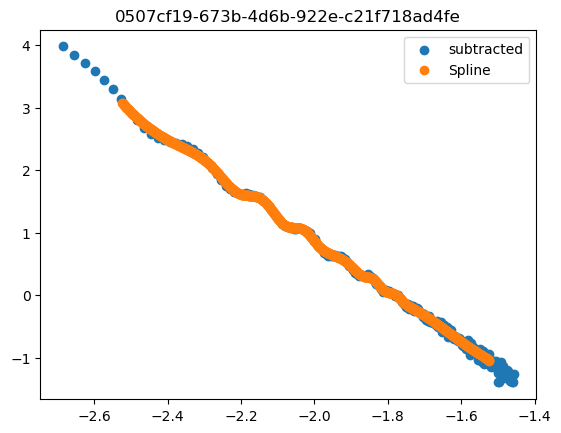

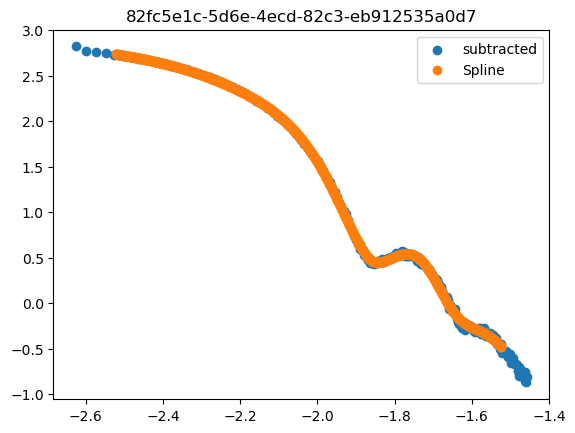

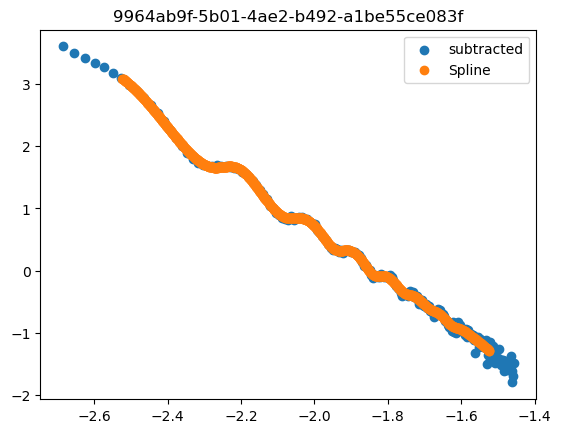

...

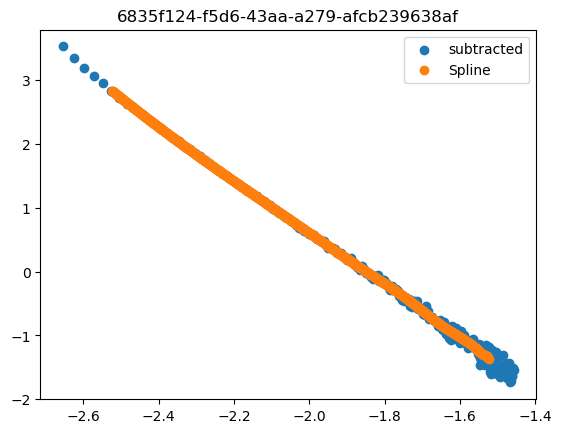

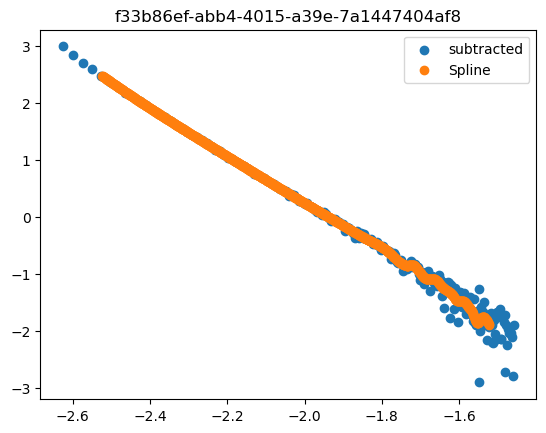

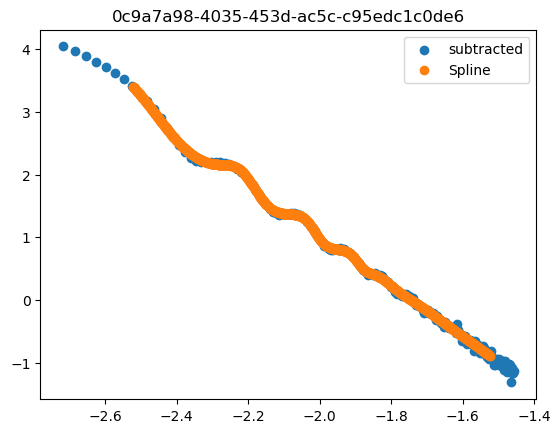

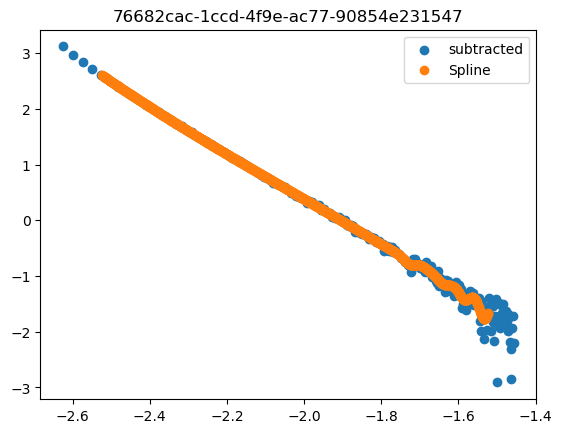

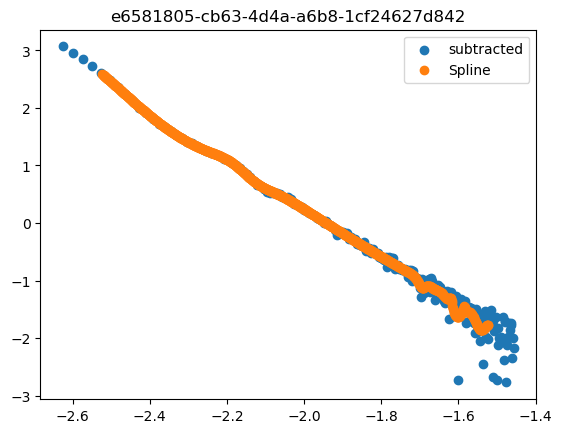

In [45]:
for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()
    
        I_subtracted = entry['I_log']
        q = entry['q_log']

        I_spline = entry['I_spline']
        
    
        ax.scatter(q, I_subtracted, label = 'subtracted')
        ax.scatter(q_grid, I_spline, label = 'Spline')
        ax.legend()
        ax.set_title(uuid_val)

## Sanity check scaling

/tmp/ipykernel_17919/1900914898.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


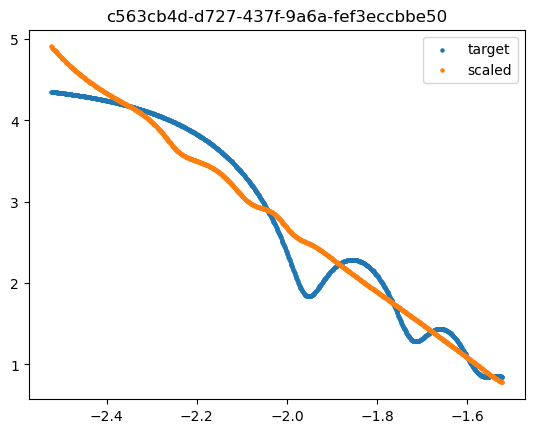

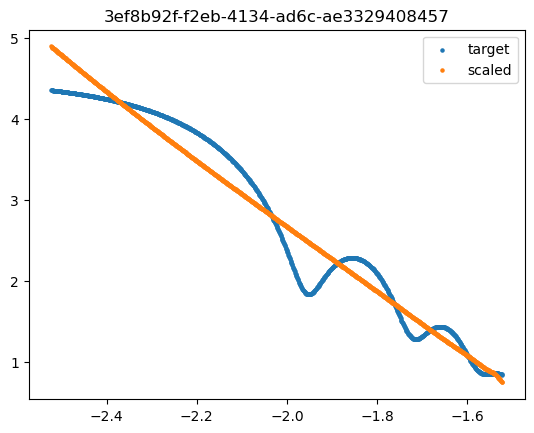

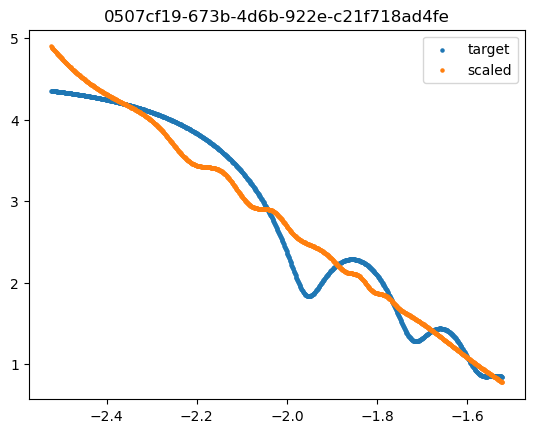

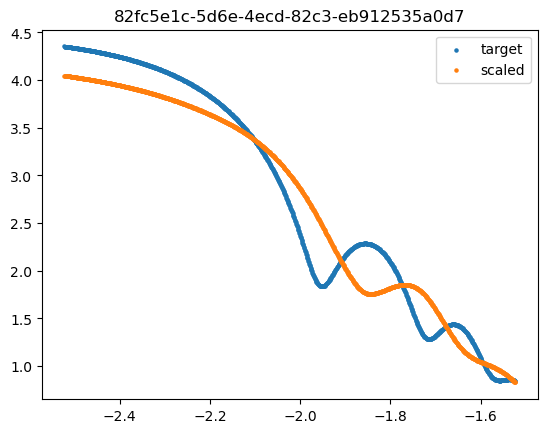

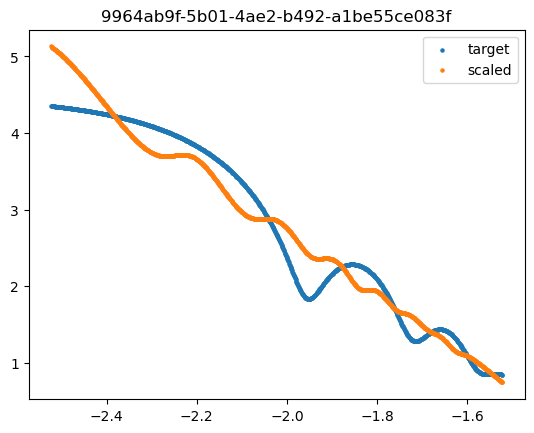

...

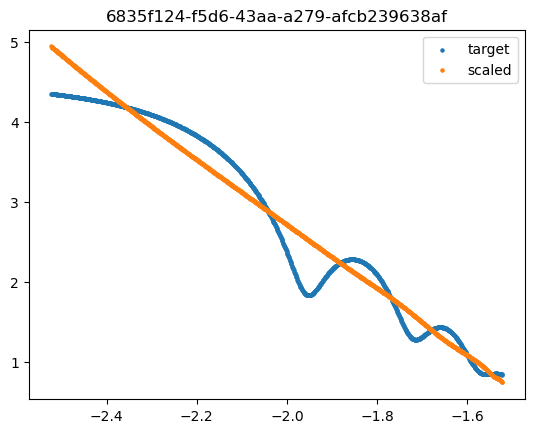

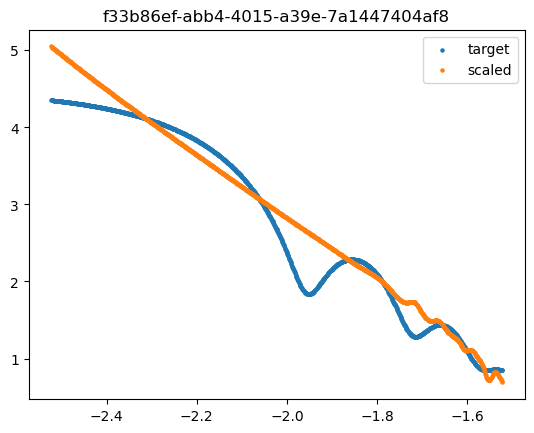

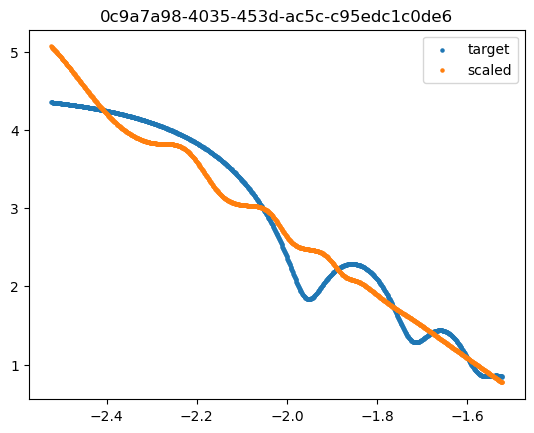

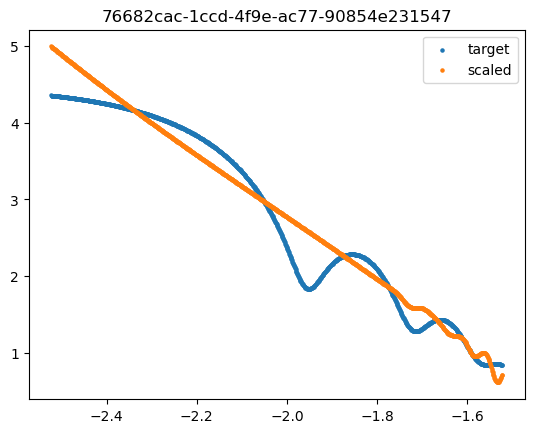

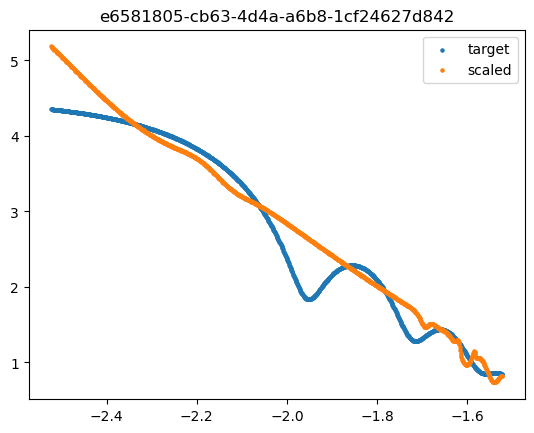

In [46]:
for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()


        I_scaled = entry['I_scaled']
        
    
        ax.scatter(q_grid, target_I, label = 'target', s = 5)
        ax.scatter(q_grid, I_scaled, label = 'scaled', s = 5)
        ax.legend()
        ax.set_title(uuid_val)

## Fit sphere model

In [47]:
for uuid_val, entry in processing_dataset.items():
    try:
        subtracted = entry['subtracted_clipped']
    except KeyError:
        continue
        
    data_sas = io.df_to_sasdata(subtracted)
    results, result_obj, problem  = sasview_fitting.fit_sphere(data_sas, polydispersity=True, r_init=50, pd_init = 0, pd_distribution='lognormal')

    processing_dataset[uuid_val]['sphere_fit_results'] = results
    processing_dataset[uuid_val]['sphere_fit_problem'] = problem

In [48]:
diameters = {}
pdi_vals = {}

for uuid_val, entry in processing_dataset.items():
    try:
        sphere_results = entry['sphere_fit_results']
        d = sphere_results['radius']*2/10
        pdi = sphere_results['radius_pd']
        diameters[uuid_val] = d
        pdi_vals[uuid_val] = pdi
    except KeyError:
        continue

## sanity check fit results

/tmp/ipykernel_17919/2583699091.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


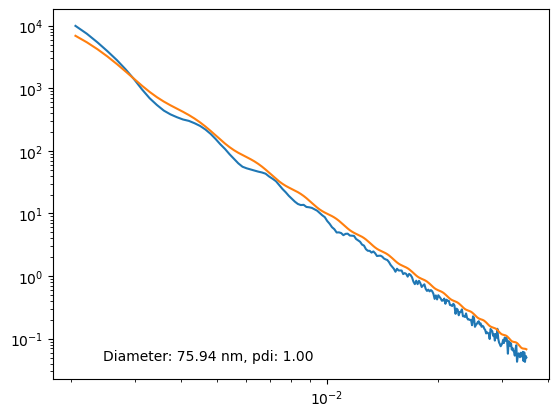

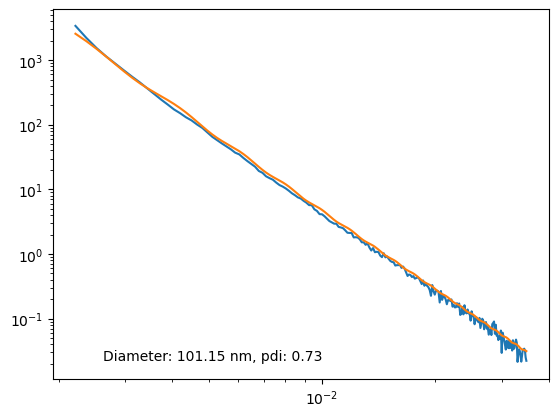

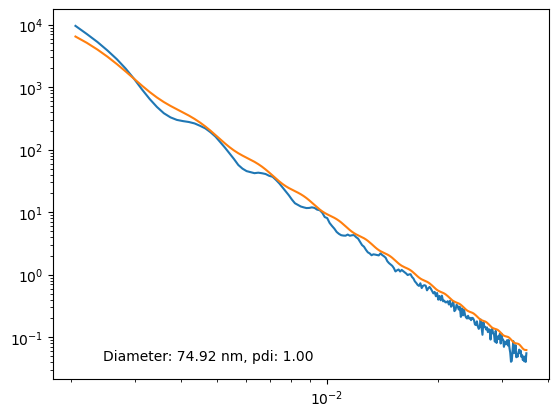

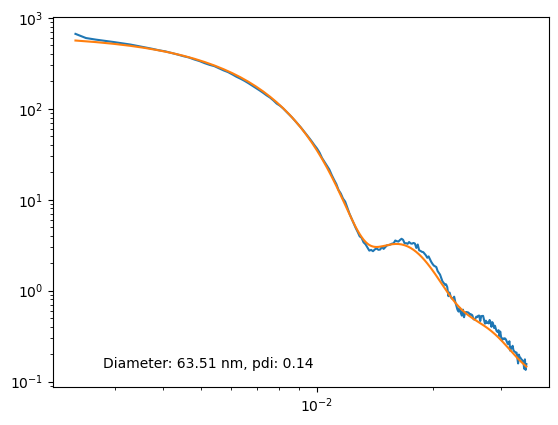

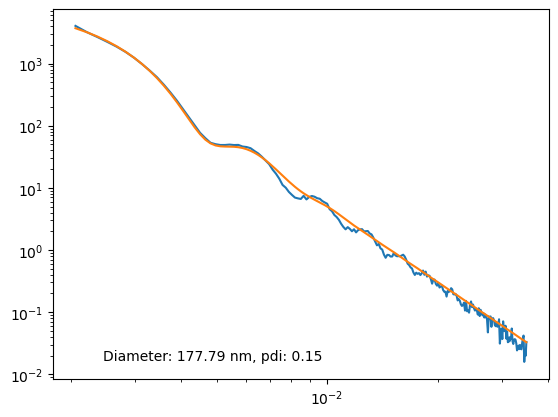

...

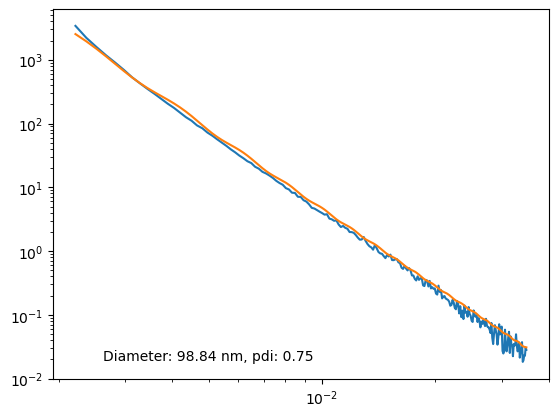

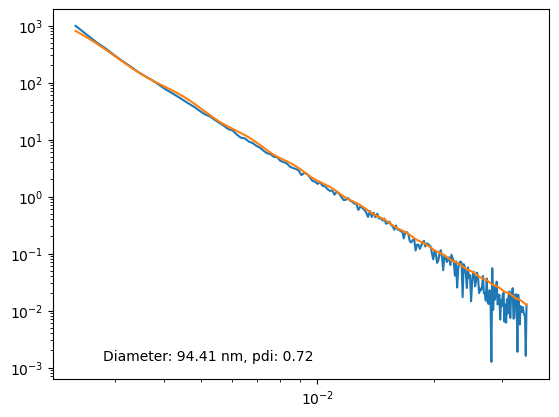

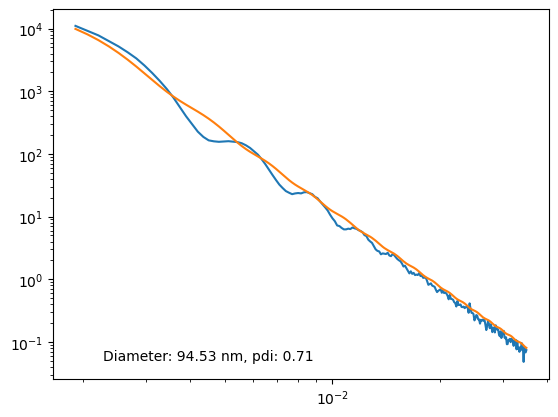

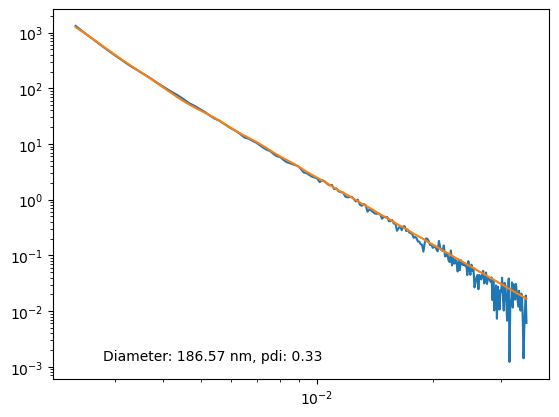

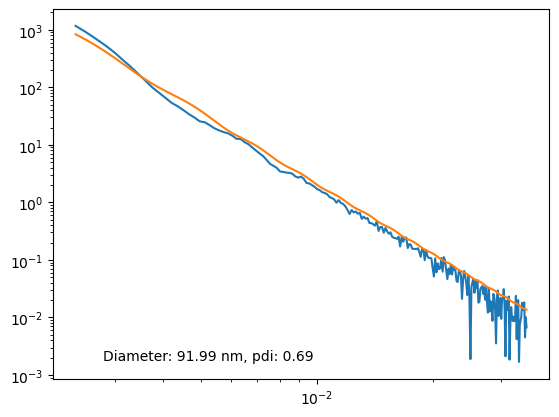

In [49]:
for uuid_val, entry in processing_dataset.items():
    try:
        sphere_d = entry['sphere_fit_results']['radius']*2/10
        sphere_pdi = entry['sphere_fit_results']['radius_pd']
    
        problem = entry['sphere_fit_problem']
    except KeyError:
        continue


    data = problem.fitness._data
    Icalc = problem.fitness.Iq_calc

    fig, ax = plt.subplots()

    ax.loglog(data.x, data.y, label = 'measured')
    ax.loglog(data.x, Icalc, label = 'fit')
    ax.text(0.1, 0.05, f'Diameter: {sphere_d:.2f} nm, pdi: {sphere_pdi:.2f}', transform = ax.transAxes)

## Write results to disk

In [50]:
uuid_vals = []
amplitude = []
phase = []
sum_ap = []
raw_rmse = []
statuses = []
sphere_diameter = []
sphere_pdi = []

for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            uuid_vals.append(uuid_val)
            amplitude.append(None)
            phase.append(None)
            sum_ap.append(None)
            statuses.append('failed')
            sphere_diameter.append(None)
            sphere_pdi.append(None)
            raw_rmse.append(None)
            continue
        else:
            raise KeyError
    except KeyError:
        uuid_vals.append(uuid_val)
        amplitude.append(entry['amplitude_distance'])
        phase.append(entry['phase_distance'])
        sum_ap.append(entry['ap_sum_distance'])
        raw_rmse.append(entry['rmse_raw'])
        statuses.append('success')
        sphere_diameter.append(entry['sphere_fit_results']['radius']*2/10)
        sphere_pdi.append(entry['sphere_fit_results']['radius_pd'])
    

In [54]:
sum_ap

[np.float64(0.5746978260967515),
 np.float64(0.5664911214035577),
 np.float64(0.5959123086562399),
 np.float64(0.304777949568282),
 np.float64(0.5745871567146102),
 np.float64(0.5507562668080555),
 None,
 np.float64(0.5625799206185439),
 np.float64(0.6047124336589257),
 np.float64(0.5824651229116039),
 np.float64(0.6081222187930662),
 np.float64(0.5718203084375704),
 np.float64(0.5971502412677823),
 np.float64(0.5477189302950582),
 np.float64(0.5654988233988875),
 np.float64(0.4562105211380058),
 np.float64(0.5833223556239451),
 np.float64(0.504158204554227),
 np.float64(0.5733394574009069),
 np.float64(0.5954300281211797),
 np.float64(0.5677906302216906),
 np.float64(0.5653142454116025),
 np.float64(0.5859170471585617),
 np.float64(0.5750947101022718),
 np.float64(0.5924439918190781),
 np.float64(0.5470316422034615),
 np.float64(0.5592617345357113),
 np.float64(0.6157242363150073),
 np.float64(0.6124310592273616),
 np.float64(0.6378985537858872),
 np.float64(0.6083862316482597),
 np.f

In [51]:
results_df = pd.DataFrame({'uuid':uuid_vals, 'amplitude_distance':amplitude, 'phase_distance':phase, 'sum_ap_distance':sum_ap, 'raw_rmse_distance':raw_rmse, 'sphere_diameter_nm':sphere_diameter, 'sphere_pdi':sphere_pdi, 'processes_status':statuses})

In [55]:
results_df.to_csv('distance_results_Round2_80nmOpt3_80nm.csv')

In [22]:
results_df

,uuid,amplitude_distance,phase_distance,sum_ap_distance,raw_rmse_distance,sphere_diameter_nm,sphere_pdi,processes_status
0,c563cb4d-d727-437f-9a6a-fef3eccbbe50,0.994091,0.528099,0.761095,0.255116,75.943310,1.000000,success
1,3ef8b92f-f2eb-4134-ad6c-ae3329408457,1.033666,0.514583,0.774125,0.264217,101.152856,0.730457,success
2,0507cf19-673b-4d6b-922e-c21f718ad4fe,0.930899,0.558692,0.744795,0.254219,74.915296,1.000000,success
3,82fc5e1c-5d6e-4ecd-82c3-eb912535a0d7,0.734126,0.257073,0.495600,0.298204,63.510045,0.136633,success
4,9964ab9f-5b01-4ae2-b492-a1be55ce083f,0.889431,0.539605,0.714518,0.302280,177.793802,0.150685,success
...,...,...,...,...,...,...,...,...
87,6835f124-f5d6-43aa-a279-afcb239638af,1.034947,0.508450,0.771698,0.267277,98.836379,0.745099,success
88,f33b86ef-abb4-4015-a39e-7a1447404af8,0.816000,0.510944,0.663472,0.297241,94.406967,0.719728,success
89,0c9a7a98-4035-453d-ac5c-c95edc1c0de6,0.956428,0.575299,0.765863,0.278223,94.531440,0.712755,success
90,76682cac-1ccd-4f9e-ac77-90854e231547,0.796285,0.513254,0.654769,0.278673,186.566854,0.331551,success


## Serialize scaled intensities

In [23]:
for uuid_val in uuid_vals:
    if '7bf7' in uuid_val:
        print(uuid_val)

7bf7296f-8eae-4228-a615-3d7b8c142d89


In [24]:
intensity_data = {}

q_grid_list = q_grid.tolist()

for uuid_val, entry in processing_dataset.items():
    if uuid_val == '7bf7296f-8eae-4228-a615-3d7b8c142d89':
        continue
    I_scaled = entry.get('I_scaled')
    if I_scaled is not None:
        I_scaled = I_scaled.tolist()
    intensity_data[uuid_val] = {'q_grid':q_grid_list, 'I_scaled':I_scaled}

In [25]:
with open('scaled_intensities_Opt2_Batch3.json', 'w') as f:
    json.dump(intensity_data, f)

## Split rmse and apdist samples



In [26]:
synthesis_files = ['/home/bgpelkie/Code/silica-np-synthesis/OptimizationRound2/2025_01_13_RandomSample/SampleTable_RandomSobol_2025_01_13.csv',
                   '/home/bgpelkie/Code/silica-np-synthesis/OptimizationRound2/2025_01_28_80nm_round1/Sample_table_2025_01_28_80nm_Round1_apdist.csv',
                   '/home/bgpelkie/Code/silica-np-synthesis/OptimizationRound2/2025_01_28_80nm_round1/Sample_table_2025_01_28_80nmRound1_rmse.csv',
                   '/home/bgpelkie/Code/silica-np-synthesis/OptimizationRound2/80nmTarget_round2/Sample_table_2025_01_30_80nm_Round2_apdist.csv',
                   '/home/bgpelkie/Code/silica-np-synthesis/OptimizationRound2/80nmTarget_round2/Sample_table_2025_01_30_80nmbatch2_rmse.csv',
                   '/home/bgpelkie/Code/silica-np-synthesis/OptimizationRound2/2025_02_03_80nmTarget_Round3/Sample_table_2025_02_03_80nm_Round3_apdist.csv',
                   '/home/bgpelkie/Code/silica-np-synthesis/OptimizationRound2/2025_02_03_80nmTarget_Round3/Sample_table_2025_02_03_80nmbatch3_rmse.csv'
                  ] 

In [27]:
fp2name = {'/home/bgpelkie/Code/silica-np-synthesis/OptimizationRound2/2025_01_13_RandomSample/SampleTable_RandomSobol_2025_01_13.csv':'Round2Random',
           '/home/bgpelkie/Code/silica-np-synthesis/OptimizationRound2/2025_01_28_80nm_round1/Sample_table_2025_01_28_80nm_Round1_apdist.csv':'Opt1_Apdist',
           '/home/bgpelkie/Code/silica-np-synthesis/OptimizationRound2/2025_01_28_80nm_round1/Sample_table_2025_01_28_80nmRound1_rmse.csv':'Opt1_rmse',
           '/home/bgpelkie/Code/silica-np-synthesis/OptimizationRound2/80nmTarget_round2/Sample_table_2025_01_30_80nm_Round2_apdist.csv':'Opt2_apdist',
           '/home/bgpelkie/Code/silica-np-synthesis/OptimizationRound2/80nmTarget_round2/Sample_table_2025_01_30_80nmbatch2_rmse.csv':'Opt2_rmse',
           '/home/bgpelkie/Code/silica-np-synthesis/OptimizationRound2/2025_02_03_80nmTarget_Round3/Sample_table_2025_02_03_80nm_Round3_apdist.csv':'Opt3_apdist',
           '/home/bgpelkie/Code/silica-np-synthesis/OptimizationRound2/2025_02_03_80nmTarget_Round3/Sample_table_2025_02_03_80nmbatch3_rmse.csv':'Opt3_rmse'
          }



In [28]:
random_files = ['Round2Random']
apdist_files = ['Opt1_Apdist', 'Opt2_apdist', 'Opt3_apdist']
rmse_files = ['Opt1_rmse', 'Opt2_rmse', 'Opt3_rmse']

In [29]:
synth_tables = []

random_uuids = []
apdist_uuids = []
rmse_uuids = []

count = 0
for fp in synthesis_files:
    data= pd.read_csv(fp)
    name = fp2name[fp]
    data['campaign'] = [name]*len(data)
    synth_tables.append(data)
    count += len(data)
    if name in random_files:
        random_uuids.extend(list(data['uuid']))
    if name in apdist_files:
        apdist_uuids.extend(list(data['uuid']))
    if name in rmse_files:
        rmse_uuids.extend(list(data['uuid']))
        
    

synth_table = pd.concat(synth_tables, axis = 0)

In [30]:
apdist_samples = random_uuids.copy()
apdist_samples.extend(apdist_uuids)

rmse_samples = random_uuids.copy()
rmse_samples.extend(rmse_uuids)

In [31]:
len(apdist_samples)

62

## Plot final ranked order of best samples APdist

In [32]:
sum_ap = {}
for uuid_val, entry in processing_dataset.items():
    if uuid_val in apdist_samples:
        try:
            
            status = entry['status']
            if status == 'failed':
                continue
            else:
                raise KeyError
                
        except KeyError:
            sum_ap[uuid_val] = entry['ap_sum_distance']
    else:
        continue


uuids = np.array(list(sum_ap.keys()))
rmses = list(sum_ap.values())
uuid_sorted_sum = uuids[np.argsort(rmses)]

In [33]:
with PdfPages('ranked_apdist_results_0point5.pdf') as pdf:
    for i, uuid_val in enumerate(uuid_sorted_sum):

        entry  = processing_dataset[uuid_val]
        I_scaled = entry['I_scaled']
        
        distance = sum_ap[uuid_val]

        sphere_d = entry['sphere_fit_results']['radius']*2/10
        sphere_pdi = entry['sphere_fit_results']['radius_pd']


    
        fig, ax = plt.subplots()
        ax.loglog(10**q_grid, 10**target_I, label = 'target')
        ax.loglog(10**q_grid, 10**I_scaled, label = 'measured (cleaned)')
        ax.set_xlabel('q [1/A]')
        ax.set_title(uuid_val)
        ax.text(0.1, 0.1, f'Rank: {i}\nsum distance: {distance:.2f}\nsphere diameter: {sphere_d:.2f} nm\nsphere pdi: {sphere_pdi:.2f}', transform = ax.transAxes)
        ax.legend()
        pdf.savefig()
        plt.close()

## Plot raw RMSE

In [34]:
raw_rmse = {}
for uuid_val, entry in processing_dataset.items():
    if uuid_val in rmse_samples:
        try:
            
            status = entry['status']
            if status == 'failed':
                continue
            else:
                raise KeyError
                
        except KeyError:
            raw_rmse[uuid_val] = entry['rmse_raw']
    else:
        continue


uuids = np.array(list(raw_rmse.keys()))
rmses = list(raw_rmse.values())
uuid_sorted_rmseraw = uuids[np.argsort(rmses)]

In [35]:
with PdfPages('ranked_rawrmse_results.pdf') as pdf:
    for i, uuid_val in enumerate(uuid_sorted_rmseraw):

        entry  = processing_dataset[uuid_val]
        I_scaled = entry['I_scaled']
        
        distance = raw_rmse[uuid_val]

        sphere_d = entry['sphere_fit_results']['radius']*2/10
        sphere_pdi = entry['sphere_fit_results']['radius_pd']


    
        fig, ax = plt.subplots()
        ax.loglog(10**q_grid, 10**target_I, label = 'target')
        ax.loglog(10**q_grid, 10**I_scaled, label = 'measured')
        ax.set_xlabel('q [1/A]')
        ax.set_title(uuid_val)
        ax.text(0.1, 0.1, f'Rank: {i}\nrmse_raw distance: {distance:.2f}\nsphere diameter: {sphere_d:.2f} nm\nsphere pdi: {sphere_pdi:.2f}', transform = ax.transAxes)
        ax.legend()
        pdf.savefig()
        plt.close()